# Magister en Data Science UDD
## Proyecto Visualización de la Información

**Autor:**
- Adolfo Fuentes Jofré

**Colaboradores**
- Catalina Murua

## 2. Geomarketing

Existen multiples definiciones de geomarketing aceptadas por igual en sus distintas disciplinas de aplicación. A continuación citamos dos que nos parecen pertinentes:

- Es un conjunto de técnicas que permiten analizar la realidad económica, social desde un punto de vista geográfico, a través de instrumentos cartográficos y herramientas de la estadística espacial. (Chasco, 2003)

- Es el área del marketing orientada hacia el conocimiento global del cliente, sus necesidades y comportamientos dentro de un entorno geográfico determinado, que nos ayuda a tener una visión mas completa del mismo y a identificar sus necesidades. (Alcaide, et al, 2012)

El analisis geoespacial tiene un potencial de utilización muy grande. Entre muchas otras cosas, se podrían segmentar los clientes utilizando distintas fuentes de información y niveles de análisis:

- Datos geográficos: donde vive, espacio urbano o rural, zona residencial o comercial, zona costera o interior, entre otros.
- Datos demográficos: edad, sexo, estado civil, nivel de escolaridad, ocupación, nacionalidad, entre otros.
- Datos socio-psicológicos: estrato socioeconómico, estilo de vida, valores ante el consumo
- Datos de comportamiento: antigüedad, frecuencia de compra, valor medio de compra, fidelidad

Como se puede observar, las posibilidades son numerosas. Para efectos prácticos, acotaremos el análisis de este trabajo priorizando la utilización del analisis espacial, geomarketing y finalmente geointeligencia. 

### 2.1. BBDD Censo

Se utilizaran distintas BBDD en este proyecto:

- BBDD_CLIENTES: Está conformada por indicadores transaccionales agrupados para cada cliente previamente anonimizado. 
- BBDD_COORDENADAS: Geoposición o sistema de coordenadas previamente calculado para cada cliente.
- CENSO: Conjunto de archivos del Censo Poblacional que contiene REGION, PROVINCIA, COMUNA, DC, AREA, ZC_LOC, ID_ZONA_LOC, estos son indicadores geograficos, notemos que cada zona esta idetificada con un `GEOCODIGO`, que es un id único para cada zona censal, este se contruye como un número que contiene, numero de comuna, de área, de distrito y de zona

## 3. Desarrollo Notebook

**Importar librerias**

Cabe señalar que además de las librerías conocidas durante el curso, se incorpora una librería propia que es GEO_LIB. Esta es una librería con múltiples aplicaciones y helpers.

In [1]:
from Funciones.GEO_LIB import Plot, Poligono, Distancia, Geodecodificacion
import pandas as pd
import numpy as np
import time
import matplotlib.pyplot as plt
import seaborn as sns
import shapely.wkt

C:\Users\Usuario\.conda\envs\GEO\lib\site-packages\pandas\core\computation\expressions.py:20: UserWarning:

Pandas requires version '2.7.3' or newer of 'numexpr' (version '2.7.1' currently installed).



### 3.1. Prueba de Concepto

Considerando el gran número de registros en la base de datos inicial (n= 6.721),seleccionaremos una muestra de estos datos para ejecutar la primera sección donde se obtiene los datos de georreferencia a partir de una dirección. Este proceso es extremadamente lento debido a que la API que se debe utilizar tiene limites de consultas por segundo.

In [2]:
data_perfil = pd.read_excel('DATOS/BBDD_CLIENTES.xlsx')[0:100]

In [3]:
data_perfil.head()

,ID_ANONIMIZADO,INDICE_PROMEDIO,DIRECCION,COMUNA,REGION,RANGO_DISTANCIA,FUGA,DIRECCION_NORMALIZADA,Label,Color
0,13005,85747.480000,Wenceslao Vargas 897 El Llano,Coquimbo,IV,Local,FUGA,"Wenceslao Vargas 897 El Llano, Coquimbo, IV",MEDIO ALTO,4
1,13030,259415.666667,Bartolome Blanche 2372,La Serena,IV,Local,ACTIVO,"Bartolome Blanche 2372, La Serena, IV",ALTO,5
2,13046,22515.172727,Los Juncos 428.,La Serena,IV,Local,FUGA,"Los Juncos 428., La Serena, IV",MEDIO BAJO,2
3,13055,539237.500000,Andres Bello 1050.,La Serena,IV,Local,FUGA,"Andres Bello 1050., La Serena, IV",ALTO,5
4,13064,39385.600000,Parcela 325 San Joaquin,La Serena,IV,Local,FUGA,"Parcela 325 San Joaquin, La Serena, IV",MEDIO,3


Se llama una funcion que a partir de la dirección previamente normalizada se conecta al servidor Nominatim para obtener las Coordenadas X,Y

In [4]:
data_perfil_coordenadas =  Geodecodificacion(data_perfil,'Nominatim')
data_perfil_coordenadas.head()

,ID_ANONIMIZADO,INDICE_PROMEDIO,DIRECCION,COMUNA,REGION,RANGO_DISTANCIA,FUGA,DIRECCION_NORMALIZADA,Label,Color,Latitud,Longitud
0,13005,85747.480000,Wenceslao Vargas 897 El Llano,Coquimbo,IV,Local,FUGA,"Wenceslao Vargas 897 El Llano, Coquimbo, IV",MEDIO ALTO,4,-29.967031,-71.342454
1,13030,259415.666667,Bartolome Blanche 2372,La Serena,IV,Local,ACTIVO,"Bartolome Blanche 2372, La Serena, IV",ALTO,5,-29.924835,-71.244555
2,13046,22515.172727,Los Juncos 428.,La Serena,IV,Local,FUGA,"Los Juncos 428., La Serena, IV",MEDIO BAJO,2,-29.945175,-71.267694
3,13055,539237.500000,Andres Bello 1050.,La Serena,IV,Local,FUGA,"Andres Bello 1050., La Serena, IV",ALTO,5,-29.90789,-71.253469
4,13064,39385.600000,Parcela 325 San Joaquin,La Serena,IV,Local,FUGA,"Parcela 325 San Joaquin, La Serena, IV",MEDIO,3,No reconocido,No reconocido


El servidor a veces no reconoce todas las direcciones, debido a multiples motivos tales como mala calidad de los datos, direcciones no precisas, etc. Por este motivo, se filtrarán aquellas direcciones que no sean reconocidas.

In [5]:
data_perfil_coordenadas=data_perfil_coordenadas[data_perfil_coordenadas['Latitud']!='No reconocido']
data_perfil_coordenadas=data_perfil_coordenadas.reset_index(drop=True)
data_perfil_coordenadas.head()

,ID_ANONIMIZADO,INDICE_PROMEDIO,DIRECCION,COMUNA,REGION,RANGO_DISTANCIA,FUGA,DIRECCION_NORMALIZADA,Label,Color,Latitud,Longitud
0,13005,85747.480000,Wenceslao Vargas 897 El Llano,Coquimbo,IV,Local,FUGA,"Wenceslao Vargas 897 El Llano, Coquimbo, IV",MEDIO ALTO,4,-29.967031,-71.342454
1,13030,259415.666667,Bartolome Blanche 2372,La Serena,IV,Local,ACTIVO,"Bartolome Blanche 2372, La Serena, IV",ALTO,5,-29.924835,-71.244555
2,13046,22515.172727,Los Juncos 428.,La Serena,IV,Local,FUGA,"Los Juncos 428., La Serena, IV",MEDIO BAJO,2,-29.945175,-71.267694
3,13055,539237.500000,Andres Bello 1050.,La Serena,IV,Local,FUGA,"Andres Bello 1050., La Serena, IV",ALTO,5,-29.90789,-71.253469
4,13078,177312.807692,Ignacio Carrera Pinto 1420,Coquimbo,IV,Local,ACTIVO,"Ignacio Carrera Pinto 1420, Coquimbo, IV",ALTO,5,-30.026482,-70.52584


**Utilizaremos una libreria previamente desarrollada que se encuentra en la carpeta Funciones que permite realizar graficos dinamicos con plotly y mapbox**

In [6]:
Plot().Latlon(df= data_perfil_coordenadas)

### 3.2. Análisis completo de todos los clientes

Cargamos el dataset que contiene los datos de clientes:

- Información transaccional como "Indice Promedio" que corresponde una valirable transaccional enmascarada. Los campos label y color son calculados a partir de la categoria cliente que tambien está relacionada con Indice promedio. El detalle de este cálculo es de carácter confidencial y no es el foco de este trabajo. Sin embargo, sí es importante entender que representa el "valor" de cada cliente y se compone de las siguentes categorias: 

    - ALTO
    - MEDIO ALTO
    - MEDIO
    - MEDIO BAJO
    - BAJO

In [7]:
df_clientes = pd.read_excel('DATOS/BBDD_CLIENTES.xlsx')
df_clientes.head()

,ID_ANONIMIZADO,INDICE_PROMEDIO,DIRECCION,COMUNA,REGION,RANGO_DISTANCIA,FUGA,DIRECCION_NORMALIZADA,Label,Color
0,13005,85747.480000,Wenceslao Vargas 897 El Llano,Coquimbo,IV,Local,FUGA,"Wenceslao Vargas 897 El Llano, Coquimbo, IV",MEDIO ALTO,4
1,13030,259415.666667,Bartolome Blanche 2372,La Serena,IV,Local,ACTIVO,"Bartolome Blanche 2372, La Serena, IV",ALTO,5
2,13046,22515.172727,Los Juncos 428.,La Serena,IV,Local,FUGA,"Los Juncos 428., La Serena, IV",MEDIO BAJO,2
3,13055,539237.500000,Andres Bello 1050.,La Serena,IV,Local,FUGA,"Andres Bello 1050., La Serena, IV",ALTO,5
4,13064,39385.600000,Parcela 325 San Joaquin,La Serena,IV,Local,FUGA,"Parcela 325 San Joaquin, La Serena, IV",MEDIO,3


**Cargaremos el dataset completo de clientes y coordenadas ya calculadas**

In [8]:
df_coordenadas = pd.read_csv('DATOS/BBDD_COORDENADAS.csv', sep=';', decimal=",")
df_coordenadas.head()

,ID_ANONIMIZADO,LATITUD,LONGITUD,DISTRITO,REGION
0,10014,-29.902390,-71.251240,Coquimbo,IV
1,11557,-29.936150,-71.240470,Coquimbo,IV
2,11705,-31.883306,-70.722985,Coquimbo,IV
3,11925,-29.934451,-71.282463,Coquimbo,IV
4,13004,-29.973158,-71.088585,Coquimbo,IV


**Fusionaremos ambas BBDD y eliminaremos columnas duplicadas y aquellas que no serán utilizadas**

In [9]:
df_clientes=df_clientes.merge(df_coordenadas,on='ID_ANONIMIZADO',how='inner')
df_clientes=df_clientes.drop(['DIRECCION', 'REGION_x','REGION_y','RANGO_DISTANCIA'], axis=1)
df_clientes=df_clientes.rename(columns={"LATITUD":"Latitud","LONGITUD":"Longitud"})
df_clientes.head()

,ID_ANONIMIZADO,INDICE_PROMEDIO,COMUNA,FUGA,DIRECCION_NORMALIZADA,Label,Color,Latitud,Longitud,DISTRITO
0,13005,85747.480000,Coquimbo,FUGA,"Wenceslao Vargas 897 El Llano, Coquimbo, IV",MEDIO ALTO,4,-29.968338,-71.341126,Coquimbo
1,13030,259415.666667,La Serena,ACTIVO,"Bartolome Blanche 2372, La Serena, IV",ALTO,5,-29.924835,-71.244555,Coquimbo
2,13046,22515.172727,La Serena,FUGA,"Los Juncos 428., La Serena, IV",MEDIO BAJO,2,-29.945175,-71.267694,Coquimbo
3,13055,539237.500000,La Serena,FUGA,"Andres Bello 1050., La Serena, IV",ALTO,5,-29.907890,-71.253469,Coquimbo
4,13064,39385.600000,La Serena,FUGA,"Parcela 325 San Joaquin, La Serena, IV",MEDIO,3,-29.923260,-71.238482,Coquimbo


### 3.2.1. Análisis y Representaciones Gráficas

Lo primero será definir el punto de georeferencia como Centroide

In [10]:
ref = (-29.946652, -71.291233)

In [11]:
dict = {'Latitud': -29.946652 , 'Longitud': -71.291233,'Label':'CENTROIDE','Color':0} 
centroide=pd.DataFrame([dict])

In [12]:
Plot().Latlon(df= centroide)

**Incoporaremos al _dataframe_ de trabajo una columna con la distancia de todos las coordenadas al pto. de referencia la cual llama a la función distancia calculada en Kilometros entre el centroide y cada punto de georeferencia de los clientes**

In [13]:
df_clientes = Distancia('km').Distancia_ref(df_clientes,ref)
df_clientes


,ID_ANONIMIZADO,INDICE_PROMEDIO,COMUNA,FUGA,DIRECCION_NORMALIZADA,Label,Color,Latitud,Longitud,DISTRITO,Distancia km
0,13005,85747.480000,Coquimbo,FUGA,"Wenceslao Vargas 897 El Llano, Coquimbo, IV",MEDIO ALTO,4,-29.968338,-71.341126,Coquimbo,5.3827
1,13030,259415.666667,La Serena,ACTIVO,"Bartolome Blanche 2372, La Serena, IV",ALTO,5,-29.924835,-71.244555,Coquimbo,5.114608
2,13046,22515.172727,La Serena,FUGA,"Los Juncos 428., La Serena, IV",MEDIO BAJO,2,-29.945175,-71.267694,Coquimbo,2.278311
3,13055,539237.500000,La Serena,FUGA,"Andres Bello 1050., La Serena, IV",ALTO,5,-29.907890,-71.253469,Coquimbo,5.635424
4,13064,39385.600000,La Serena,FUGA,"Parcela 325 San Joaquin, La Serena, IV",MEDIO,3,-29.923260,-71.238482,Coquimbo,5.715201
...,...,...,...,...,...,...,...,...,...,...,...
6716,200066728,39450.000000,Coquimbo,FUGA,"Pedro Montt 150, Coquimbo, IV",MEDIO,3,-29.959211,-71.344730,Coquimbo,5.34857
6717,200067080,161271.600000,Coquimbo,ACTIVO,"av costanera 5415 depto 1719, Coquimbo, IV",ALTO,5,-30.194638,-71.430927,Coquimbo,30.612427
6718,200083659,1038.700000,La Serena,FUGA,"Alberto Arenas 2845, La Serena, IV",BAJO,1,-29.924686,-71.241588,Coquimbo,5.376157
6719,200090608,219.300000,Coquimbo,FUGA,"LOS PERALES 0679 AV DE MAR, Coquimbo, IV",BAJO,1,-29.964966,-71.334048,Coquimbo,4.604606


**Graficaremos a todos clientes que esten asociados al centroide de Coquimbo**

In [14]:
Plot().Latlon(df= df_clientes)

**Si se hace un alejamiento (zoom out) al gráfico interactivo se pueden observar que hay muchos clientes que provienen de otras comunas fuera del conurbano Coquimbo - La Serena entre las que podemos encontrar Vicuña, Andacollo, Guanaqueros, Ovalle, etc**

### 3.2.1.1 Zona de Influencia

**En el ámbito de la investigación de mercado y retail, definir un radio de influencia es importante para el análisis de clientes. Este proceso incorpora variables que exceden el objetivo de este proyecto, pero para efectos prácticos y como opción más utilizada en la literatura, lo definiremos como un círculo con un radio de 10 Km. con centro en la geolocalización del Centroide**

**En términos prácticos, se utilizará una funcion de la libreria Shapely previamente definida que permite generar una circunferencia con X puntos y un radio de Y Kilometros. Ahora crearemos una circunferencia centrada en la posición del casino con 1000 puntos y un radio de 10 KM**

In [15]:
polygon_circunferencia = Poligono.Circunferencia_v4(lat_center = -29.9469, lon_center = -71.2913, radio = 10)
#Poligono.

C:\Users\Usuario\.conda\envs\GEO\lib\site-packages\shapely\ops.py:274: FutureWarning:

This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1

C:\Users\Usuario\.conda\envs\GEO\lib\site-packages\shapely\ops.py:276: FutureWarning:

This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1



In [16]:
polygon_circunferencia

[[-71.18751080404124, -29.946859338199072],
 [-71.18800142047644, -29.95567461490123],
 [-71.18948711872301, -29.96440576613158],
 [-71.19195384469118, -29.972968673186426],
 [-71.19537807685545, -29.981280816790253],
 [-71.19972704373667, -29.989262073854338],
 [-71.20495903155701, -29.996835491885665],
 [-71.21102377941452, -30.003928033482413],
 [-71.21786295842772, -30.010471283615807],
 [-71.22541073042865, -30.016402112737126],
 [-71.233594380945, -30.021663289160653],
 [-71.24233502042065, -30.02620403465438],
 [-71.25154834688811, -30.029980517716734],
 [-71.26114546263682, -30.032956279623672],
 [-71.27103373682884, -30.03510258899042],
 [-71.28111770550397, -30.036398721299374],
 [-71.2913, -30.036832160591874],
 [-71.30148229449604, -30.036398721299374],
 [-71.31156626317117, -30.03510258899042],
 [-71.3214545373632, -30.032956279623672],
 [-71.3310516531119, -30.029980517716734],
 [-71.34026497957936, -30.02620403465438],
 [-71.34900561905502, -30.021663289160653],
 [-71.35

**Se asigna un color y etiqueta al poligono para que luego pueda ser graficada**

In [17]:
circunferencia = pd.DataFrame(polygon_circunferencia,columns = ['Longitud','Latitud'])
circunferencia = circunferencia.assign( Color = 0, Label = 'Circunferencia')
circunferencia

,Longitud,Latitud,Color,Label
0,-71.187511,-29.946859,0,Circunferencia
1,-71.188001,-29.955675,0,Circunferencia
2,-71.189487,-29.964406,0,Circunferencia
3,-71.191954,-29.972969,0,Circunferencia
4,-71.195378,-29.981281,0,Circunferencia
...,...,...,...,...
60,-71.195444,-29.912450,0,Circunferencia
61,-71.192006,-29.920757,0,Circunferencia
62,-71.189523,-29.929316,0,Circunferencia
63,-71.188020,-29.938045,0,Circunferencia


**Solo a modo de referencia graficamos esta circunferencia la cual utilizaremos para filtrar a los clientes que se encuentren dentro de este poligono**

In [18]:
Plot().Latlon(df= circunferencia) #scale_color=False

**Filtramos el _dataframe_ en función "Interior_Poligono" de las coordenadas geográficas que están al interior de un círculo utilizando otra funcion previamente definida**


In [19]:
df_circunferencia_1 = Poligono.Interior_Poligono(df_clientes, polygon_circunferencia)
df_circunferencia_1 

,ID_ANONIMIZADO,INDICE_PROMEDIO,COMUNA,FUGA,DIRECCION_NORMALIZADA,Label,Color,Latitud,Longitud,DISTRITO,Distancia km,filtro
0,13005,85747.480000,Coquimbo,FUGA,"Wenceslao Vargas 897 El Llano, Coquimbo, IV",MEDIO ALTO,4,-29.968338,-71.341126,Coquimbo,5.3827,True
1,13030,259415.666667,La Serena,ACTIVO,"Bartolome Blanche 2372, La Serena, IV",ALTO,5,-29.924835,-71.244555,Coquimbo,5.114608,True
2,13046,22515.172727,La Serena,FUGA,"Los Juncos 428., La Serena, IV",MEDIO BAJO,2,-29.945175,-71.267694,Coquimbo,2.278311,True
3,13055,539237.500000,La Serena,FUGA,"Andres Bello 1050., La Serena, IV",ALTO,5,-29.907890,-71.253469,Coquimbo,5.635424,True
4,13064,39385.600000,La Serena,FUGA,"Parcela 325 San Joaquin, La Serena, IV",MEDIO,3,-29.923260,-71.238482,Coquimbo,5.715201,True
...,...,...,...,...,...,...,...,...,...,...,...,...
6714,200041106,31825.500000,La Serena,FUGA,"Gualliguaica 1280. La Florida, La Serena, IV",MEDIO,3,-29.924156,-71.215775,Coquimbo,7.700379,True
6715,200065759,32528.709091,La Serena,ACTIVO,"Alberto Arenas 2515, La Serena, IV",MEDIO,3,-29.924686,-71.241588,Coquimbo,5.376157,True
6716,200066728,39450.000000,Coquimbo,FUGA,"Pedro Montt 150, Coquimbo, IV",MEDIO,3,-29.959211,-71.344730,Coquimbo,5.34857,True
6718,200083659,1038.700000,La Serena,FUGA,"Alberto Arenas 2845, La Serena, IV",BAJO,1,-29.924686,-71.241588,Coquimbo,5.376157,True


**Ahora graficaremos solo los clientes dentro de la circunferencia utlizando una escala de color que representa el valor de cada cliente**

In [20]:
Plot().Latlon(df= df_circunferencia_1)

In [21]:
df_circunferencia_1['Distancia km']

0         5.3827
1       5.114608
2       2.278311
3       5.635424
4       5.715201
          ...   
6714    7.700379
6715    5.376157
6716     5.34857
6718    5.376157
6719    4.604606
Name: Distancia km, Length: 5566, dtype: object

**Ahora veremos cual es la distribución de la distancias de los clientes al Centroide**

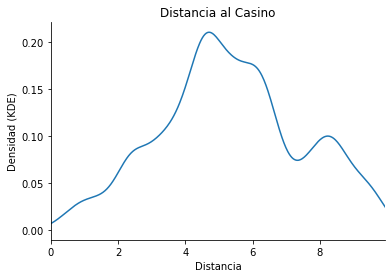

In [22]:
df_circunferencia_1['Distancia km'].plot(kind='kde')

plt.xlim([0, df_circunferencia_1['Distancia km'].max()])
plt.title('Distancia al Casino')
plt.xlabel('Distancia')
plt.ylabel('Densidad (KDE)')

sns.despine()

**Se pueden observar dos máximos de densidad con centro en distancia de alrededor de 5 KM y otro con 8,5 KM**

**Ahora graficaremos tanto la zona de influencia como los clientes para que se pueda representar de mejor manera el filtro de clientes dentro de la zona de influencia**

Seleccionamos las columnas de interés

In [23]:
# Seleccionamos las columnas de interés.
df_circunferencia_1 = df_circunferencia_1[['Longitud','Latitud','Label','Color']]
df_circunferencia_1

,Longitud,Latitud,Label,Color
0,-71.341126,-29.968338,MEDIO ALTO,4
1,-71.244555,-29.924835,ALTO,5
2,-71.267694,-29.945175,MEDIO BAJO,2
3,-71.253469,-29.907890,ALTO,5
4,-71.238482,-29.923260,MEDIO,3
...,...,...,...,...
6714,-71.215775,-29.924156,MEDIO,3
6715,-71.241588,-29.924686,MEDIO,3
6716,-71.344730,-29.959211,MEDIO,3
6718,-71.241588,-29.924686,BAJO,1


Union DataFrames clientes y poligonos

In [24]:
df_circunferencia_2 = pd.concat([df_circunferencia_1, circunferencia,centroide], ignore_index=True)
df_circunferencia_2


,Longitud,Latitud,Label,Color
0,-71.341126,-29.968338,MEDIO ALTO,4
1,-71.244555,-29.924835,ALTO,5
2,-71.267694,-29.945175,MEDIO BAJO,2
3,-71.253469,-29.907890,ALTO,5
4,-71.238482,-29.923260,MEDIO,3
...,...,...,...,...
5627,-71.192006,-29.920757,Circunferencia,0
5628,-71.189523,-29.929316,Circunferencia,0
5629,-71.188020,-29.938045,Circunferencia,0
5630,-71.187511,-29.946859,Circunferencia,0


**Realizamos el grafico final de clientes filtrados dentro de la zona de influencia**

In [46]:
Plot().Latlon(df= df_circunferencia_2, scalecolor="viridis",file_name='Output/output_dispersion.html')

### 3.2.1.2. Mapa Censo  

**Utilizaremos como referencia la clase 03 de Visualización con la libreria _geopandas_ para cargar datos geográficos. Sin embargo, de acuerdo a los datos analizados, utilizaremos la información proporcionada por el Censo para la IV región.

El detalle se encuentra [aquí] (https://redatam-ine.ine.cl/manuales/Manual-Usuario.pdf "MANUAL DE USUARIO DE LA BASE DE DATOS DEL CENSO DE POBLACIÓN Y VIVIENDA 2017")**

In [27]:
import geopandas as gpd

In [28]:
coquimbo = gpd.read_file('vec_map\\R04\\ZONA_C17.shp')
coquimbo.head()

,REGION,NOM_REGION,PROVINCIA,NOM_PROVIN,COMUNA,NOM_COMUNA,URBANO,DISTRITO,LOC_ZON,GEOCODIGO,SHAPE_Leng,SHAPE_Area,geometry
0,4,REGIÓN DE COQUIMBO,43,LIMARÍ,4302,COMBARBALÁ,COMBARBALÁ,2,1,4302021001,0.103709,0.000214,"POLYGON ((-70.99950 -31.17226, -70.99940 -31.1..."
1,4,REGIÓN DE COQUIMBO,43,LIMARÍ,4302,COMBARBALÁ,COMBARBALÁ,1,1,4302011001,0.056294,0.000102,"POLYGON ((-71.00153 -31.17280, -71.00137 -31.1..."
2,4,REGIÓN DE COQUIMBO,43,LIMARÍ,4304,PUNITAQUI,PUNITAQUI,1,1,4304011001,0.136859,0.000356,"POLYGON ((-71.25987 -30.81929, -71.25993 -30.8..."
3,4,REGIÓN DE COQUIMBO,43,LIMARÍ,4304,PUNITAQUI,PUNITAQUI,1,2,4304011002,0.051984,0.000107,"POLYGON ((-71.25880 -30.81881, -71.25869 -30.8..."
4,4,REGIÓN DE COQUIMBO,41,ELQUI,4103,ANDACOLLO,ANDACOLLO,1,1,4103011001,0.083729,0.000162,"POLYGON ((-71.07846 -30.22332, -71.07835 -30.2..."


**Graficaremos todos los poligonospara explorar la region**

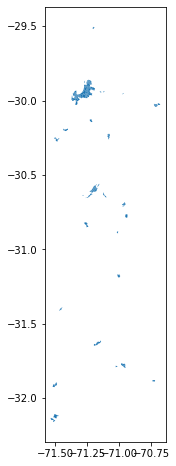

In [29]:
fig, ax = plt.subplots(1, 1, figsize=(12,8))

coquimbo.plot(ax=ax)

plt.show()

**Agruparemos por Distrito Censal para ver que comunas son las que agrupan mayor cantidad de distritos censales**

In [30]:
coquimbo.groupby(by=["NOM_COMUNA"]).sum().sort_values("DISTRITO")

<ipython-input-30-27c814750a27>:1: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



,DISTRITO,LOC_ZON,SHAPE_Leng,SHAPE_Area
NOM_COMUNA,,,,
LA HIGUERA,1,1,0.066482,0.000103
ANDACOLLO,2,3,0.220300,0.000405
PUNITAQUI,2,3,0.188843,0.000464
COMBARBALÁ,3,2,0.160002,0.000315
CANELA,12,1,0.102965,0.000158
ILLAPEL,17,10,0.352520,0.000626
LOS VILOS,18,13,0.568641,0.001409
VICUÑA,19,8,0.309746,0.000553
SALAMANCA,28,9,0.372273,0.000812


**Considerando que las dos comunas que más representación tienen son las de Coquimbo y La Serena, filtraremos estas dos comunas.**

In [31]:
coquimbo_ciudad=coquimbo[(coquimbo["NOM_COMUNA"]=="COQUIMBO")|(coquimbo["NOM_COMUNA"]=="LA SERENA")]

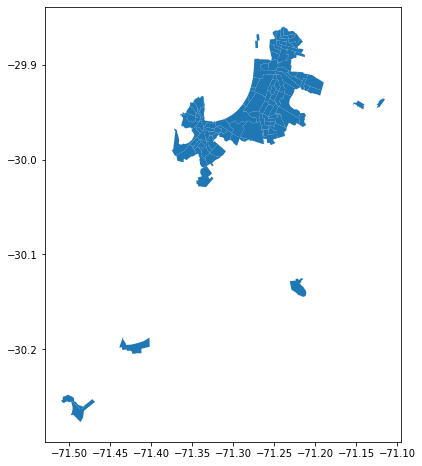

In [32]:
fig, ax = plt.subplots(1, 1, figsize=(12,8))

coquimbo_ciudad.plot(ax=ax)

plt.show()

**A pesar de haber filtrado para estas 2 comunas, aún se observan en el mapa sectores que se encuentran muy apartados del centro del conurbano y que corresponden a áreas rurales. Por tanto, agruparemos utilizando la variable Urbano**

In [33]:
coquimbo_ciudad_urbano=coquimbo_ciudad[(coquimbo_ciudad["URBANO"]=="COQUIMBO")|(coquimbo_ciudad["URBANO"]=="LA SERENA")] 


**Luego de Filtrar sectores Urbanos para las comunas de Coquimbo y la serena tenemos la zona o region de interés para este análisis**

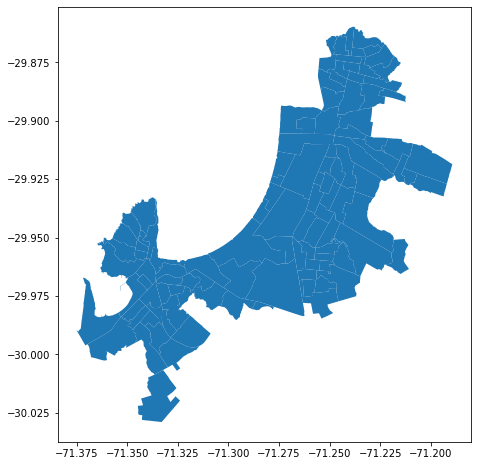

In [34]:
fig, ax = plt.subplots(1, 1, figsize=(12,8))

coquimbo_ciudad_urbano.plot(ax=ax)

plt.show()

**Exportaremos estos datos en formato de valores separados por comas (.CSV) incluyendo donde esta el poligono de cada distrito**

In [35]:
coquimbo_ciudad_urbano.to_csv('coquimbo_serena.csv')
coquimbo_ciudad_urbano=coquimbo_ciudad_urbano.reset_index(drop=True)
coquimbo_ciudad_urbano

,REGION,NOM_REGION,PROVINCIA,NOM_PROVIN,COMUNA,NOM_COMUNA,URBANO,DISTRITO,LOC_ZON,GEOCODIGO,SHAPE_Leng,SHAPE_Area,geometry
0,4,REGIÓN DE COQUIMBO,41,ELQUI,4102,COQUIMBO,COQUIMBO,1,1,4102011001,0.068650,0.000118,"POLYGON ((-71.33743 -29.93291, -71.33742 -29.9..."
1,4,REGIÓN DE COQUIMBO,41,ELQUI,4102,COQUIMBO,COQUIMBO,1,2,4102011002,0.068314,0.000069,"POLYGON ((-71.33594 -29.93373, -71.33594 -29.9..."
2,4,REGIÓN DE COQUIMBO,41,ELQUI,4102,COQUIMBO,COQUIMBO,2,6,4102021006,0.040978,0.000058,"POLYGON ((-71.34766 -29.93957, -71.34648 -29.9..."
3,4,REGIÓN DE COQUIMBO,41,ELQUI,4102,COQUIMBO,COQUIMBO,5,1,4102051001,0.111203,0.000361,"POLYGON ((-71.28425 -29.94405, -71.28411 -29.9..."
4,4,REGIÓN DE COQUIMBO,41,ELQUI,4102,COQUIMBO,COQUIMBO,2,1,4102021001,0.044751,0.000074,"POLYGON ((-71.35240 -29.94373, -71.35106 -29.9..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...
106,4,REGIÓN DE COQUIMBO,41,ELQUI,4101,LA SERENA,LA SERENA,5,6,4101051006,0.052350,0.000103,"POLYGON ((-71.24067 -29.92927, -71.24065 -29.9..."
107,4,REGIÓN DE COQUIMBO,41,ELQUI,4101,LA SERENA,LA SERENA,5,11,4101051011,0.065528,0.000077,"POLYGON ((-71.24695 -29.94239, -71.24685 -29.9..."
108,4,REGIÓN DE COQUIMBO,41,ELQUI,4101,LA SERENA,LA SERENA,5,10,4101051010,0.030804,0.000044,"POLYGON ((-71.24888 -29.94133, -71.24894 -29.9..."
109,4,REGIÓN DE COQUIMBO,41,ELQUI,4101,LA SERENA,LA SERENA,4,2,4101041002,0.031641,0.000045,"POLYGON ((-71.28163 -29.93754, -71.28082 -29.9..."


### 3.2.1.3. Unión de Georeferencia de Clientes con Mapa Censal   

Para trabajar con los datos de clientes, primero debemos transformarlos a un GeoDataFrame.

In [36]:
geo_clientes = gpd.GeoDataFrame(df_circunferencia_1,
                                geometry=gpd.points_from_xy(df_circunferencia_1['Latitud'],
                                                            df_circunferencia_1['Longitud']),
                                crs="epsg:3005")

geo_clientes

,Longitud,Latitud,Label,Color,geometry
0,-71.341126,-29.968338,MEDIO ALTO,4,POINT (-29.968 -71.341)
1,-71.244555,-29.924835,ALTO,5,POINT (-29.925 -71.245)
2,-71.267694,-29.945175,MEDIO BAJO,2,POINT (-29.945 -71.268)
3,-71.253469,-29.907890,ALTO,5,POINT (-29.908 -71.253)
4,-71.238482,-29.923260,MEDIO,3,POINT (-29.923 -71.238)
...,...,...,...,...,...
6714,-71.215775,-29.924156,MEDIO,3,POINT (-29.924 -71.216)
6715,-71.241588,-29.924686,MEDIO,3,POINT (-29.925 -71.242)
6716,-71.344730,-29.959211,MEDIO,3,POINT (-29.959 -71.345)
6718,-71.241588,-29.924686,BAJO,1,POINT (-29.925 -71.242)


**A continuación se calcularán la cantidad de clientes que viven dentro de cada distrito. Este caso es distinto y más complejo que el visto en clases dado que aquí no se conoce _a priori_ a que poligono id de poligono o a que geocodigo está asociado cada punto. Luego utilizamos la funcion Interior_Poligono de la libreria donde se itera sobre cada distrito censal y se evalua cada punto de coordenadas que está contenido en el distrito censal**

In [37]:
coquimbo_ciudad_urbano['Cantidad_Clientes'] = None
for i in range(len(coquimbo_ciudad_urbano)):
    clientes =  Poligono.Interior_Poligono(geo_clientes, coquimbo_ciudad_urbano["geometry"].iloc[i])
    coquimbo_ciudad_urbano.loc[i,'Cantidad_Clientes'] = float(len(clientes))
coquimbo_ciudad_urbano    
#No borrar. Sin esto no se grafican los colores.
#coquimbo_ciudad_urbano['Cantidad_Clientes'] = np.int64(coquimbo_ciudad_urbano['Cantidad_Clientes'])

,REGION,NOM_REGION,PROVINCIA,NOM_PROVIN,COMUNA,NOM_COMUNA,URBANO,DISTRITO,LOC_ZON,GEOCODIGO,SHAPE_Leng,SHAPE_Area,geometry,Cantidad_Clientes
0,4,REGIÓN DE COQUIMBO,41,ELQUI,4102,COQUIMBO,COQUIMBO,1,1,4102011001,0.068650,0.000118,"POLYGON ((-71.33743 -29.93291, -71.33742 -29.9...",28.0
1,4,REGIÓN DE COQUIMBO,41,ELQUI,4102,COQUIMBO,COQUIMBO,1,2,4102011002,0.068314,0.000069,"POLYGON ((-71.33594 -29.93373, -71.33594 -29.9...",151.0
2,4,REGIÓN DE COQUIMBO,41,ELQUI,4102,COQUIMBO,COQUIMBO,2,6,4102021006,0.040978,0.000058,"POLYGON ((-71.34766 -29.93957, -71.34648 -29.9...",7.0
3,4,REGIÓN DE COQUIMBO,41,ELQUI,4102,COQUIMBO,COQUIMBO,5,1,4102051001,0.111203,0.000361,"POLYGON ((-71.28425 -29.94405, -71.28411 -29.9...",170.0
4,4,REGIÓN DE COQUIMBO,41,ELQUI,4102,COQUIMBO,COQUIMBO,2,1,4102021001,0.044751,0.000074,"POLYGON ((-71.35240 -29.94373, -71.35106 -29.9...",30.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
106,4,REGIÓN DE COQUIMBO,41,ELQUI,4101,LA SERENA,LA SERENA,5,6,4101051006,0.052350,0.000103,"POLYGON ((-71.24067 -29.92927, -71.24065 -29.9...",118.0
107,4,REGIÓN DE COQUIMBO,41,ELQUI,4101,LA SERENA,LA SERENA,5,11,4101051011,0.065528,0.000077,"POLYGON ((-71.24695 -29.94239, -71.24685 -29.9...",34.0
108,4,REGIÓN DE COQUIMBO,41,ELQUI,4101,LA SERENA,LA SERENA,5,10,4101051010,0.030804,0.000044,"POLYGON ((-71.24888 -29.94133, -71.24894 -29.9...",80.0
109,4,REGIÓN DE COQUIMBO,41,ELQUI,4101,LA SERENA,LA SERENA,4,2,4101041002,0.031641,0.000045,"POLYGON ((-71.28163 -29.93754, -71.28082 -29.9...",39.0


In [38]:
#No borrar. Sin esto no se grafican los colores.
coquimbo_ciudad_urbano['Cantidad_Clientes'] = np.int64(coquimbo_ciudad_urbano['Cantidad_Clientes'])

**Se define el centro del mapa y se indexan los distritos para relacionarlos con las ubicaciones. Este indexador debe ser único.**

In [39]:
center = [-71.273,-29.95517]

coquimbo_ciudad_urbano['Index'] = coquimbo_ciudad_urbano['GEOCODIGO']

**Se grafica con escala de color usando choropleth_mapbox. Este paso es relevante puesto que nos permite utilizar una escala de colores representativa (basada en _viridis_) para mostrar el espectro de densidades.**

In [40]:
plot_map=Plot().plot_polygon_mapbox(censo=coquimbo_ciudad_urbano, geojd=coquimbo_ciudad_urbano[['geometry','Index']], center=center, scalecolor=False, id_color='Cantidad_Clientes', filename='Output/output_map.html')

In [41]:
clientes=df_circunferencia_2[df_circunferencia_2['Label']!='Circunferencia']
clientes


,Longitud,Latitud,Label,Color
0,-71.341126,-29.968338,MEDIO ALTO,4
1,-71.244555,-29.924835,ALTO,5
2,-71.267694,-29.945175,MEDIO BAJO,2
3,-71.253469,-29.907890,ALTO,5
4,-71.238482,-29.923260,MEDIO,3
...,...,...,...,...
5562,-71.241588,-29.924686,MEDIO,3
5563,-71.344730,-29.959211,MEDIO,3
5564,-71.241588,-29.924686,BAJO,1
5565,-71.334048,-29.964966,BAJO,1


In [42]:
# Se cuenta la cantidad de repeticiones que hay por coordenada geográfica
densidad = clientes[['Longitud','Latitud']].value_counts().reset_index()
densidad.rename(columns={0:'count'}, inplace=True)
densidad

,Longitud,Latitud,count
0,-71.338150,-29.954100,127
1,-71.251240,-29.902390,39
2,-71.250195,-29.878641,36
3,-71.350000,-29.988890,30
4,-71.341412,-29.979375,29
...,...,...,...
3452,-71.336918,-29.987983,1
3453,-71.258671,-29.969464,1
3454,-71.258662,-29.972511,1
3455,-71.258596,-29.898201,1


In [45]:
Plot().plot_density_mapbox(censo=densidad, count= 'count', opacity =1, center=center, filename='Output/output_heat_map.html')

## 4. Conclusiones y Comentarios Finales

Este informe contiene un análisis de datos y visualización de información de clientes que puede contribuir al analisis de cualquier Compañía.

Desde el punto de vista técnico, los aspectos que quisiéramos relevar de este trabajo son los siguientes:

1. Hemos generado visualizaciones novedosas que entrecruzan datos de georreferenciación con datos propios del negocio de la Compañía. Esto es interesante porque se utilizaron datos existentes en distintos repositorios.

2. Dentro de las visualizaciones novedosas, se utilizaron librerías no vistas antes tales como Mapbox, Shapely, Geopy entre otras. Esto nos ayudó a generar visualizaciones en la forma de mapas dinámicos con posibilidad de zoom in/out, rotaciones y movimientos en 3D, archivos HTML, entre otros.

El presente trabajo resultó extremadamente útil para implementar un método de trabajo con el fin de generar un producto de valor agregado y un "entregable" que servirá para expandir el análisis aquí propuesto a otras unidades de negocio. No cabe duda que esta primera aproximación puede y deberá ser enriquecida incorporando otras variables (ej. comunas rurales, segmentación por estrato socioeconómico, etc) pero creemos que este proyecto cumple con dejar sentadas las bases para futuros análisis.

## 5. Referencias

1. https://pypi.org/project/Shapely/
2. https://plotly.com/
3. https://geopy.readthedocs.io/en/stable/
4. https://geopandas.org/en/stable/docs.html
